<a href="https://colab.research.google.com/github/XUE985/CV_EMSSE/blob/main/CV_Exercise.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Task 1**: Load the built-in image 'coffee' of the skimage libraries. Details can be found at https://scikit-image.org/docs/stable/auto_examples/data/plot_general.html#sphx-glr-auto-examples-data-plot-general-py


**Task 2:** Use the skimage function random_noise to add each of the 7 different types of noise available and generate a **4x2** panel figure with the original image and the **7 corrupted versions. The noise types are**:

‘**gaussian**’ Gaussian-distributed additive noise.
‘**localvar**’ Gaussian-distributed additive noise, with specified local variance at each point of image.
‘**poisson**’ Poisson-distributed noise generated from the data.
‘**salt**’ Replaces random pixels with 1.
‘**pepper**’ Replaces random pixels with 0 (for unsigned images) or -1 (for signed images).
‘**s&p**’ Replaces random pixels with either 1 or low_val, where low_val is 0 for unsigned images or -1 for signed images.
‘**speckle**’ Multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance.
Documentation of the function can be found at https://scikit-image.org/docs/stable/api/skimage.util.html#skimage.util.random_noise

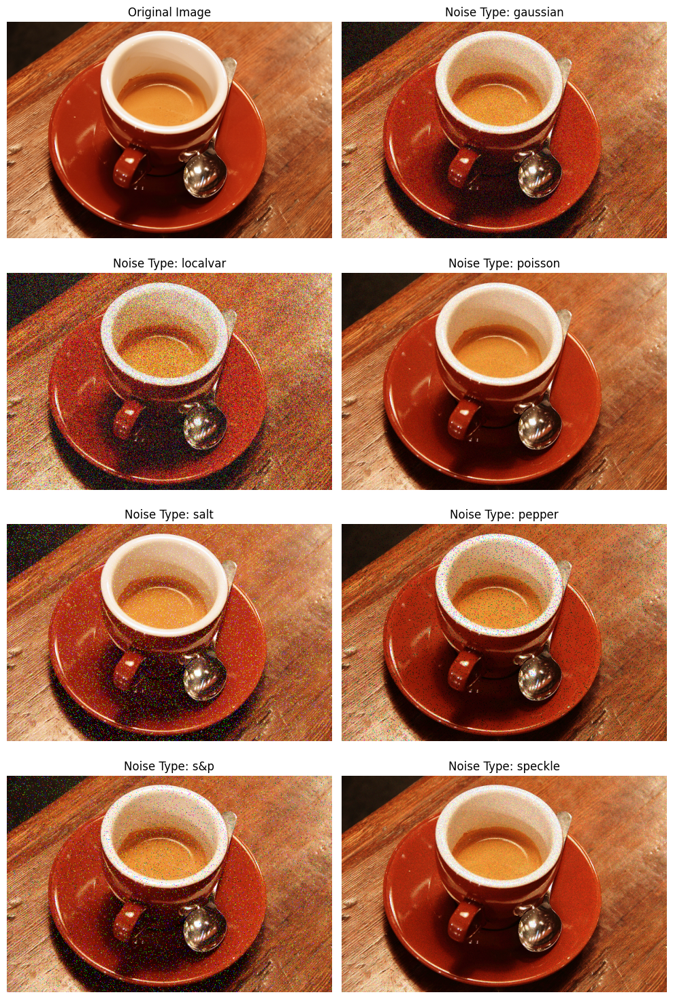

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_uint
from skimage.util import random_noise
from skimage.filters import gaussian, prewitt
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk
from skimage.color import rgb2gray
from scipy import ndimage
import math

# Task 1: Load the 'coffee' image
coffee = data.coffee()

# Task 2: Add different types of noise and display
noise_types = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle']
fig, axes = plt.subplots(4, 2, figsize=(10, 15))  # Create a 4x2 grid of subplots

# Plot the original image in the top-left corner
axes[0, 0].imshow(coffee, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

# Add noise to the image and plot the results
for i, noise_type in enumerate(noise_types):
    # Calculate the row and column index for the subplot
    row = (i + 1) // 2  # Start from the second row
    col = (i + 1) % 2

    # Add noise to the image using the specified mode
    if noise_type == 'localvar':
        # Generate localvar noise using a separate method
        local_variance = np.random.rand(*coffee.shape) * 0.1  # Adjust variance as needed
        noisy_image = random_noise(coffee, mode='gaussian', var=local_variance)
    else:
        noisy_image = random_noise(coffee, mode=noise_type)

    # Display the noisy image in the current subplot
    axes[row, col].imshow(noisy_image, cmap='gray')
    axes[row, col].set_title(f'Noise Type: {noise_type}')
    axes[row, col].axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

**Task 3:** Select one of the noise types and **generate 3 noisy images** with different noise intensity levels. Represent the original image along with them in a **2x2 figure**.

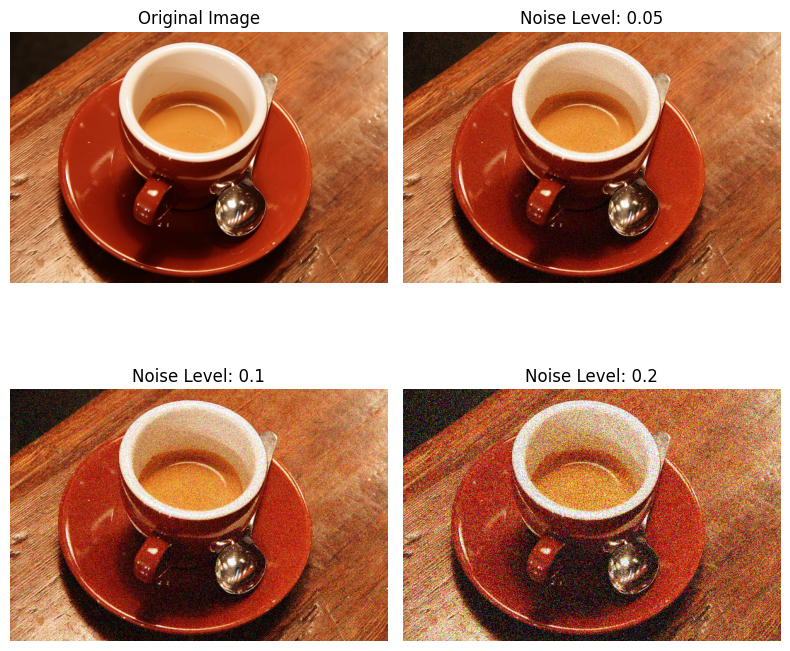

In [2]:
# Task 3: Generate noisy images with different intensity levels
noise_type = 'gaussian'  # Select your desired noise type
noise_levels = [0.05, 0.1, 0.2]  # Adjust intensity levels as needed

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes[0, 0].imshow(coffee, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

for i, noise_level in enumerate(noise_levels):
    # Add noise to the image using the specified mode
    if noise_type == 's&p':
        noisy_image = random_noise(coffee, mode=noise_type, amount=noise_level)
    else:
        noisy_image = random_noise(coffee, mode=noise_type, var=noise_level**2)

    # Updated row and column calculation
    row = (i + 1) // 2
    col = (i + 1) % 2

    axes[row, col].imshow(noisy_image, cmap='gray')
    axes[row, col].set_title(f'Noise Level: {noise_level}')
    axes[row, col].axis('off')

plt.tight_layout()
# To see the output, run the code.

**Task 4**: The standard deviation for **Gaussian kernel** affects the behavior of the **gaussian filter** (parameter sigma, see documentation https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.gaussian). Explore the effect of the ** parameter sigma** when applying a gaussian filter to the tree noisy images generated in the previus task. Represent and comment the results.

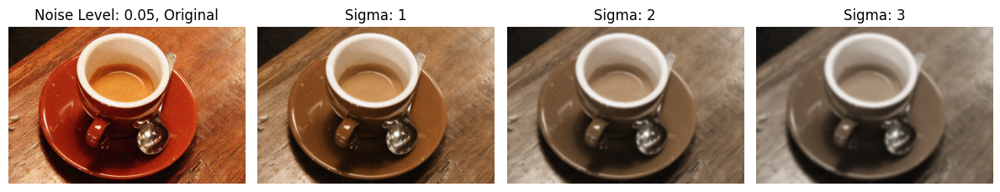

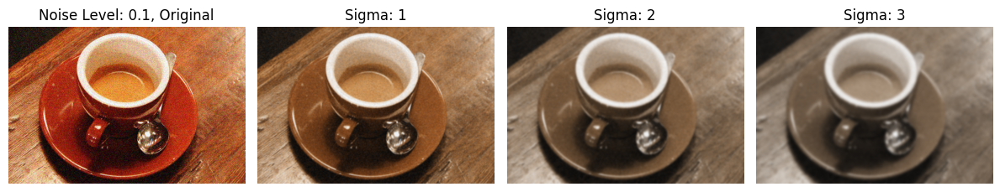

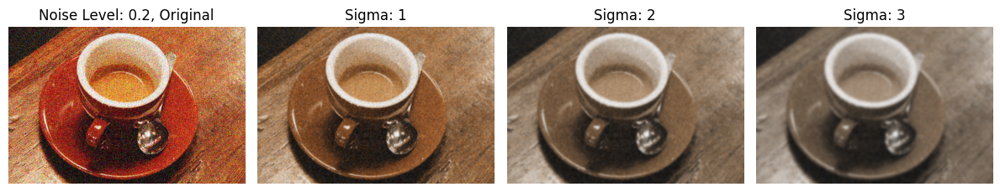

In [3]:
# Task 4: Explore the effect of sigma in Gaussian filter
sigma_values = [1, 2, 3]  # Adjust sigma values as needed

for i, noise_level in enumerate(noise_levels):
    noisy_image = random_noise(coffee, mode=noise_type, var=noise_level**2)  # Use var for Gaussian
    fig, axes = plt.subplots(1, len(sigma_values) + 1, figsize=(12, 4))
    axes[0].imshow(noisy_image, cmap='gray')
    axes[0].set_title(f'Noise Level: {noise_level}, Original')
    axes[0].axis('off')

    for j, sigma in enumerate(sigma_values):
        filtered_image = gaussian(noisy_image, sigma=sigma)
        axes[j + 1].imshow(filtered_image, cmap='gray')
        axes[j + 1].set_title(f'Sigma: {sigma}')
        axes[j + 1].axis('off')

    plt.tight_layout()

  # Comment on the effect of sigma:
    # As sigma increases, the Gaussian filter becomes more blurred, smoothing out the noise
    # but also potentially losing fine details in the image.

**Task 5:** Detect the edges of the bricks in the built-in image 'bricks' using a **Prewitt edge detection** filter. Quantify what is the **fraction of the image** corresponding to bricks and to edges.

Brick Fraction: 0.1902
Edge Fraction: 0.9857


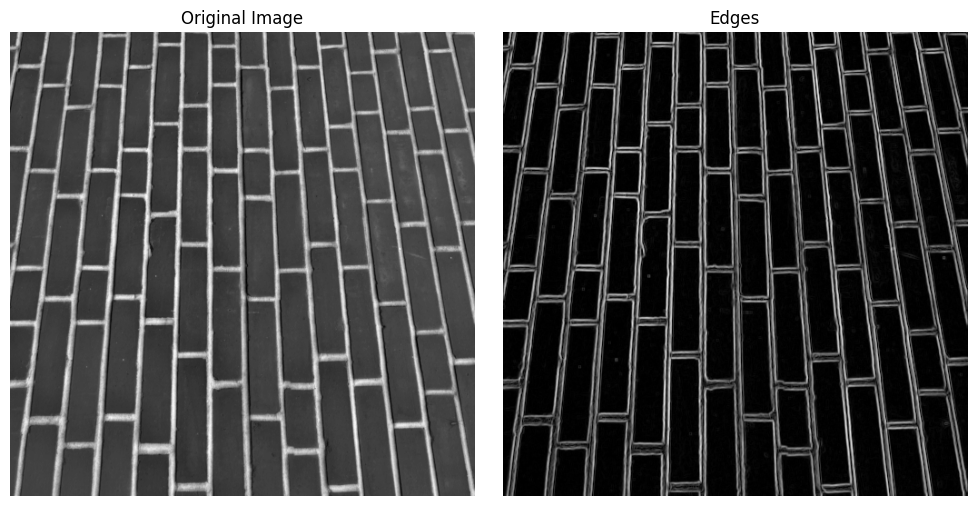

In [8]:
# Task 5: Detect edges and quantify fractions
bricks = data.brick()
edges = prewitt(bricks)

# Calculate fractions
total_pixels = bricks.size
brick_pixels = np.count_nonzero(bricks > 128)  # Assuming bricks are brighter
edge_pixels = np.count_nonzero(edges)

brick_fraction = brick_pixels / total_pixels
edge_fraction = edge_pixels / total_pixels

print(f"Brick Fraction: {brick_fraction:.4f}")
print(f"Edge Fraction: {edge_fraction:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(bricks, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(edges, cmap='gray')
axes[1].set_title('Edges')
axes[1].axis('off')
plt.tight_layout()

**Task 6**: Apply a **high-pass filter and a low-pass filter** in the frequency domain to the skimage built-in image 'grass'. Represent the results and discuss the correspondance between spatial patterns in the original image and high/low frequency components of its the Fourier transform.

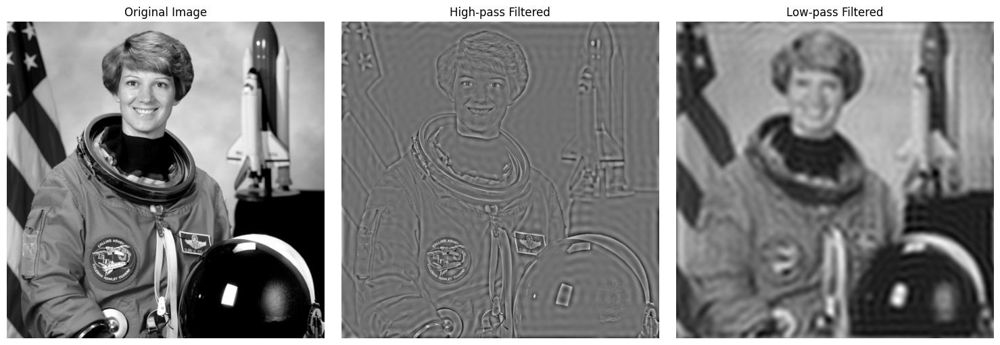

In [11]:
# Task 6: Apply high-pass and low-pass filters

from skimage import data, io, filters, util
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pyplot as plt

# Load the 'astronaut' image
image = data.astronaut()
image_gray = rgb2gray(image)

# Fourier Transform
image_fft = np.fft.fft2(image_gray)
image_fft_shifted = np.fft.fftshift(image_fft)

# Create high-pass and low-pass masks
rows, cols = image_gray.shape
crow, ccol = rows // 2, cols // 2
mask_radius = 30  # Adjust radius for filter strength

# High-pass mask
mask_hp = np.ones((rows, cols), np.uint8)
mask_hp[crow - mask_radius:crow + mask_radius, ccol - mask_radius:ccol + mask_radius] = 0

# Low-pass mask
mask_lp = np.zeros((rows, cols), np.uint8)
mask_lp[crow - mask_radius:crow + mask_radius, ccol - mask_radius:ccol + mask_radius] = 1

# Apply masks and inverse transform
image_hp = np.fft.ifft2(np.fft.ifftshift(image_fft_shifted * mask_hp)).real
image_lp = np.fft.ifft2(np.fft.ifftshift(image_fft_shifted * mask_lp)).real

# Display results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(image_hp, cmap='gray')
axes[1].set_title('High-pass Filtered')
axes[1].axis('off')
axes[2].imshow(image_lp, cmap='gray')
axes[2].set_title('Low-pass Filtered')
axes[2].axis('off')
plt.tight_layout()

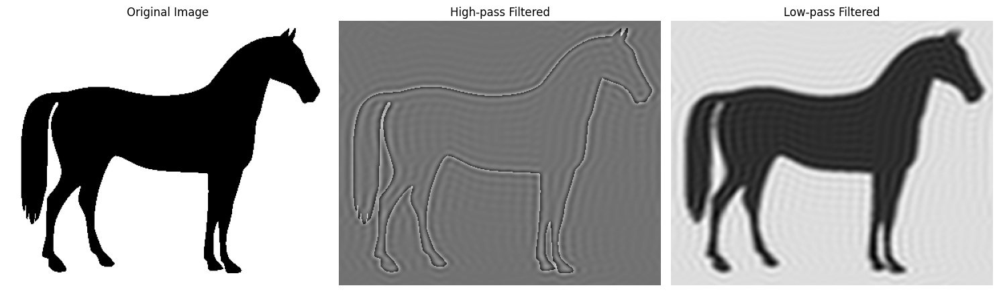

In [12]:
# Task 6: Apply high-pass and low-pass filters

from skimage import data, io, filters, util
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pyplot as plt

# Load the 'horse' binary image (already grayscale)
image_gray = data.horse().astype(float)

# Fourier Transform
image_fft = np.fft.fft2(image_gray)
image_fft_shifted = np.fft.fftshift(image_fft)

# Create high-pass and low-pass masks
rows, cols = image_gray.shape
crow, ccol = rows // 2, cols // 2
mask_radius = 30  # Adjust radius for filter strength

# High-pass mask
mask_hp = np.ones((rows, cols), np.uint8)
mask_hp[crow - mask_radius:crow + mask_radius, ccol - mask_radius:ccol + mask_radius] = 0

# Low-pass mask
mask_lp = np.zeros((rows, cols), np.uint8)
mask_lp[crow - mask_radius:crow + mask_radius, ccol - mask_radius:ccol + mask_radius] = 1

# Apply masks and inverse transform
image_hp = np.fft.ifft2(np.fft.ifftshift(image_fft_shifted * mask_hp)).real
image_lp = np.fft.ifft2(np.fft.ifftshift(image_fft_shifted * mask_lp)).real

# Display results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image_gray, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(image_hp, cmap='gray')
axes[1].set_title('High-pass Filtered')
axes[1].axis('off')
axes[2].imshow(image_lp, cmap='gray')
axes[2].set_title('Low-pass Filtered')
axes[2].axis('off')
plt.tight_layout()

**Task 7:** Use the function binary_blobs to generate an image with random blobs: https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.binary_blobs How many consecutive morphological erosions are needed in order to **remove all the blobs**? Use a **disk-shaped structuring element of radius 3** pixels (footprint). https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk

In [14]:
# Task 7: Morphological erosions to remove blobs

from skimage.data import binary_blobs
from skimage.morphology import erosion, disk
import numpy as np

blobs = binary_blobs(length=32, blob_size_fraction=0.1, volume_fraction=0.5)
footprint = disk(3)
num_erosions = 0

while np.any(blobs):  # Check if any blobs remain
    blobs = erosion(blobs, footprint)
    num_erosions += 1

print(f"Number of erosions needed: {num_erosions}")

Number of erosions needed: 2


# **Exercise2**

**Task 1:** Load an image and apply a **thresholding method**. Analyze and discuss the **segmentation results**.

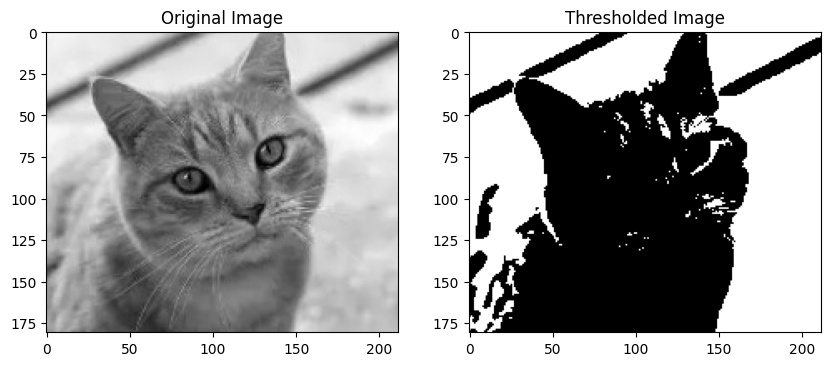

In [19]:
import skimage as sk
import matplotlib.pyplot as plt
from skimage import io
from skimage.filters import threshold_otsu

# Load the image
image = sk.io.imread('/content/cat1.jpg', as_gray=True)

# Apply Otsu's thresholding
threshold = threshold_otsu(image)
binary_image = image > threshold

# Display results
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image, cmap=plt.cm.gray)
axes[0].set_title('Original Image')
axes[1].imshow(binary_image, cmap=plt.cm.gray)
axes[1].set_title('Thresholded Image')
plt.show()

# Analysis of results
# Otsu's thresholding finds the threshold that maximizes inter-class variance.
# In this case, it separates pixels into two groups: object and background.
# The effectiveness depends on the image contrast.

**Discussion:** Thresholding is a simple but effective method for segmenting images with high contrast. However, it can fail if the image has illumination variations or noise.

**Task 2:** Load an image and apply an **unsupervised segmentation method (e.g., K-Means)**. Evaluate and comment on the outcome.

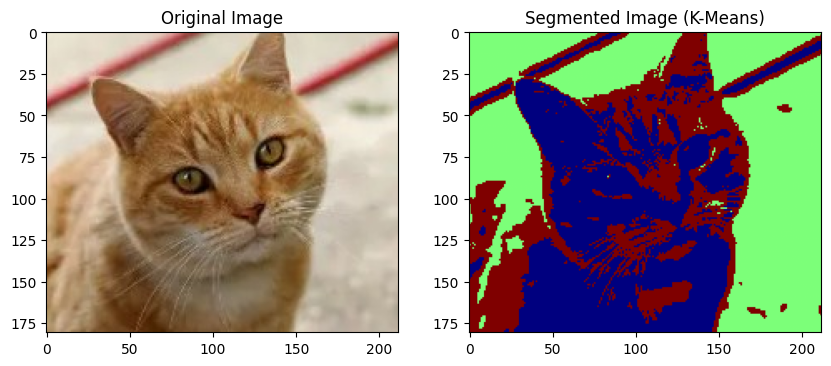

In [20]:
import numpy as np
from sklearn.cluster import KMeans

# Load the image
image = sk.io.imread('/content/cat1.jpg')

# Convert the image to a 2D array
image_2D = image.reshape((-1, 3))

# Apply K-Means with 3 clusters
kmeans = KMeans(n_clusters=3, random_state=0).fit(image_2D)
segmented_image = kmeans.labels_.reshape(image.shape[:2])

# Display results
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image)
axes[0].set_title('Original Image')
axes[1].imshow(segmented_image, cmap=plt.cm.jet)
axes[1].set_title('Segmented Image (K-Means)')
plt.show()

# Evaluation of results
# K-Means groups pixels into clusters based on their color similarity.
# The quality of segmentation depends on the choice of the number of clusters.
# Metrics like silhouette score can be used to evaluate the quality.

***Comments:*** K-Means is a versatile method for segmentation, but the choice of the number of clusters can be crucial. Evaluation with metrics like silhouette score can help optimize the results.

**Task 3**: Load an image and apply a **supervised segmentation** method (e.g., with annotated labels or using a classifier). Discuss the effectiveness and limitations.

**Task 3: Supervised Segmentation (Classifier)**

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Path of the folder in your google drive unit where you have the images:

path = '/content/images'

# Load the image and labels
image = sk.io.imread('/content/cat1.jpg')
labels = sk.io.imread('/content/catlabel.png', as_gray=True).astype(int)

# Convert to 2D arrays
image_2D = image.reshape((-1, 3))
labels_1D = labels_resized.flatten()

from skimage.transform import resize

labels_resized = resize(labels, (181, 212), anti_aliasing=True)  # Resize to match image
labels_resized = (labels_resized * 255).astype(int)  # Convert back to int


# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    image_2D, labels_1D, test_size=0.2, random_state=0
)

# Train a Random Forest classifier
classifier = RandomForestClassifier(random_state=0).fit(X_train, y_train)

# Predict labels for the test image
predicted_labels = classifier.predict(X_test)

# Display results
# ... (code to display the segmented image)

# Discussion of effectiveness and limitations
# Supervised segmentation uses labels to train a model.
# It can be very accurate if sufficient labeled data is available.
# However, labeling data can be expensive and time-consuming.

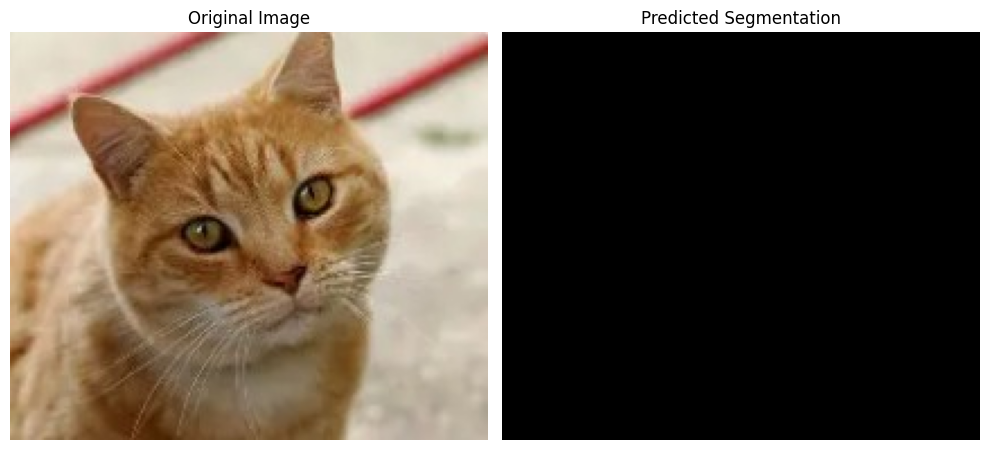

In [37]:
import matplotlib.pyplot as plt

predicted_labels_full = classifier.predict(image_2D)

# Reshape properly
predicted_labels_img = predicted_labels_full.reshape(image.shape[0], image.shape[1])

# Display Original Image vs. Predicted Labels
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(image)  # Show original image
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(predicted_labels_img, cmap="gray")  # Show predicted labels
axes[1].set_title("Predicted Segmentation")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [40]:
print("Image shape:", image.shape)
print("Labels shape:", labels.shape)

Image shape: (181, 212, 3)
Labels shape: (463, 687)


our classifier was trained on a subset of pixels from the original image.

Your test set (X_test) contains only a fraction of the image's pixels, meaning the predictions are not for the entire image.

**Task 4**:Explain the main differences between supervised and unsupervised segmentation approaches. Discuss their advantages and disadvantages, and illustrate your explanation with an example.

**Unsupervised Segmentation:**

Does not require labels.
Groups pixels based on similarity (color, texture, etc.).
Examples: K-Means, GMM.
Advantages: Simple, does not require labeled data.
Disadvantages: Less accurate, parameter choice can be crucial.

**Supervised Segmentation:**

Requires labels.
Trains a model to predict labels.
Examples: Classifiers, neural networks.
Advantages: More accurate if sufficient labeled data is available.
Disadvantages: Requires labeled data, can be expensive and time-consuming.

**Example:**

**Unsupervised:** Segmenting an image of cells using K-Means to group pixels by color.
**Supervised:** Segmenting tumors in medical images using a classifier trained with images labeled by experts.

# **Exercise 3**

**Load image**

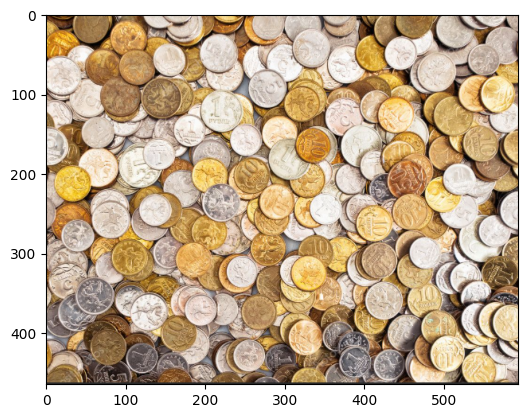

In [44]:
import matplotlib.pyplot as plt
import skimage as sk
from skimage import io

from skimage.filters import threshold_otsu
from skimage.measure import label

# 1. read RGB image
I = sk.io.imread('/content/coin.jpg')
plt.imshow(I)

In [45]:
print(I.shape)  # This will reveal the actual dimensions


(465, 594, 4)


**2.Convert from RGB to grayscale**

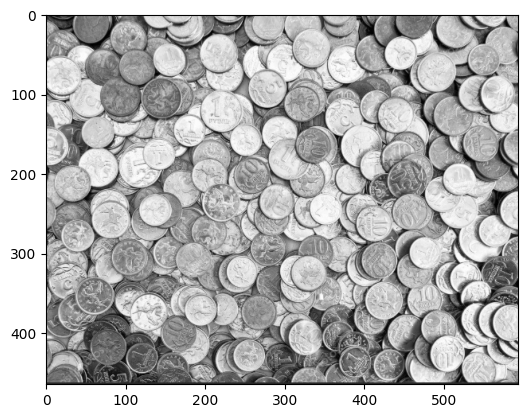

In [50]:
# Keep only the first three channels (R, G, B)
I_rgb = I[:, :, :3]
IG = sk.color.rgb2gray(I_rgb) # Convert RGB image to grayscale

# Display the grayscale image
plt.imshow(IG,cmap='gray')

3.Gamma correction with r=0,5

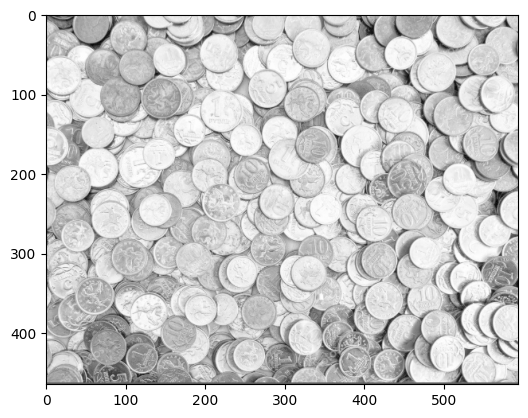

In [51]:
from skimage import exposure

IGC = exposure.adjust_gamma(IG, 0.5)
plt.imshow(IGC,cmap='gray')

**4.Otsu threshold from grayscale (non gamma corrected)**

In [52]:
# Apply Otsu threshold for segmentation :
thresh = threshold_otsu(IG)
print(thresh)

0.5987722549019607


**5.Apply Otsu's threhold to gamma-corrected image**

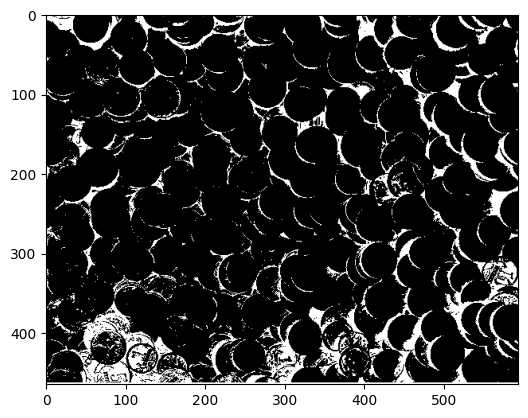

In [53]:
bw = IGC < thresh # keep lighter regions with grayscale intensities above threshold
plt.imshow(bw,cmap='gray')

**6.label the objects**

number of regions is 1085


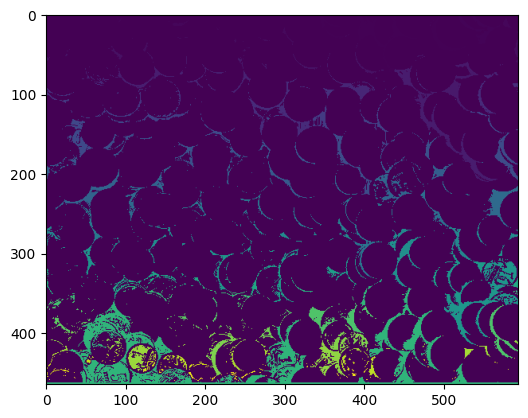

In [54]:
label_image, nregions = label(bw,return_num=True)

plt.imshow(label_image)
print('number of regions is {}'.format(nregions))

**7.Extract regional properties (Area and eccentrici**ty)

In [55]:
import pandas as pd
from skimage import measure

props = measure.regionprops_table(label_image,properties=['label','area','eccentricity'])

df_features = pd.DataFrame(props)
df_features.head()

,label,area,eccentricity
0,1,970.0,0.917491
1,2,1191.0,0.969462
2,3,19.0,0.922912
3,4,27.0,0.948035
4,5,187.0,0.935094


<Axes: xlabel='area', ylabel='eccentricity'>

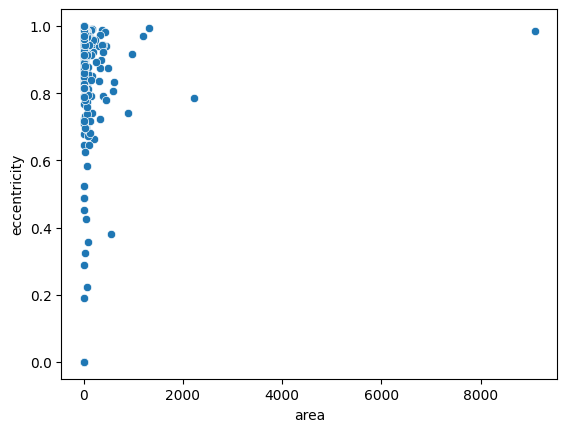

In [56]:
import seaborn as sns

sns.scatterplot(x='area',y='eccentricity',data=df_features)

**8.Find coins as objects with area higher than 300 and eccentricity lower than 0.8**

In [60]:
df_coins = df_features.loc[(df_features['area']>300) & (df_features['eccentricity']<0.8)]

df_coins.head()
print('number of idenfitied coins is {}'.format(df_coins.shape[0]))

number of idenfitied coins is 6


In [61]:
indx_coins = df_coins['label'].values

In [62]:
indx_coins

array([  7,  10, 571, 788, 905, 923])

In [63]:
import numpy as np
mask_coins = np.isin(label_image,indx_coins)

**9.Plot the coins**

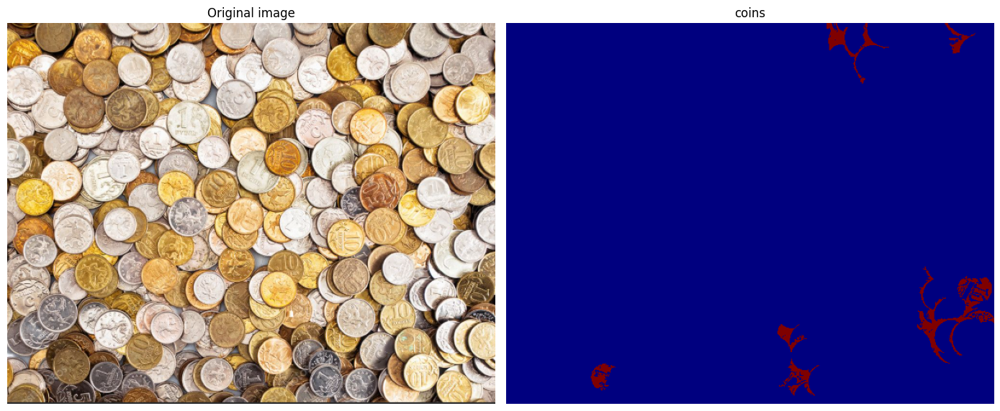

In [64]:
# Get some figures:
fig, axes = plt.subplots(1,2,figsize=(14, 9))
ax = axes.ravel()
ax[0].imshow(I)
ax[0].set_title('Original image')
ax[1].imshow(mask_coins,cmap=plt.cm.jet)
ax[1].set_title('coins') # set figure title
ax[0].set_axis_off()
ax[1].set_axis_off()
plt.tight_layout()
plt.show()

# **Exercise 4**

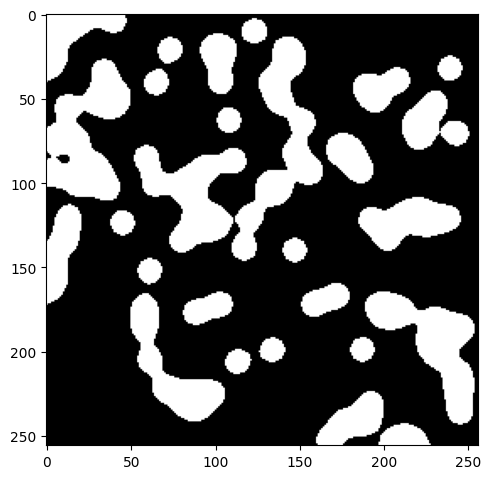

In [65]:
from skimage import data, measure
import skimage as sk
import matplotlib.pyplot as plt

IG = data.binary_blobs(length=256, blob_size_fraction=0.1,volume_fraction=0.3)

fig = plt.figure(figsize=(5,5))
plt.imshow(IG,cmap='gray')
plt.tight_layout()
plt.show()

**2. Object segmentation and labeling**

a.Segmentation of blobs using Otsu's optimal threshold

b.Labeling connected regions

c.Visualization

/usr/local/lib/python3.11/dist-packages/skimage/exposure/exposure.py:306: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  hist, bin_edges = np.histogram(image, bins=bins, range=hist_range)


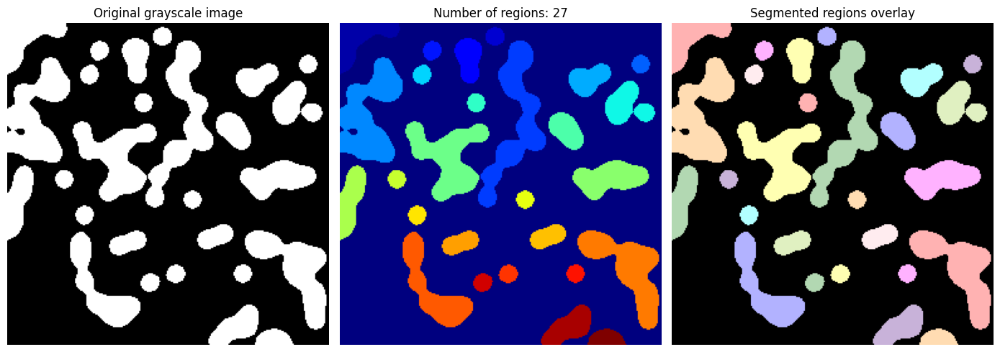

In [66]:
from skimage.filters import threshold_otsu
from skimage.measure import label
from skimage.color import label2rgb

# Apply Otsu threshold for segmentation :
thresh = threshold_otsu(IG)
bw = IG > thresh # keep lighter regions with grayscale intensities above threshold

# label image regions:
label_image, nregions = label(bw,return_num=True)
image_label_overlay = label2rgb(label_image, image=IG)

# Get some figures:
fig, axes = plt.subplots(1,3,figsize=(14, 9))
ax = axes.ravel()
ax[0].imshow(IG,cmap=plt.cm.gray)
ax[0].set_title('Original grayscale image')
ax[1].imshow(label_image,cmap=plt.cm.jet)
ax[1].set_title('Number of regions: {}'.format(nregions)) # set figure title
ax[2].imshow(image_label_overlay,cmap=plt.cm.jet)
ax[2].set_title('Segmented regions overlay')

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()
plt.tight_layout()
plt.show()

# **3. Get regional properties in a pandas dataframe**

In [67]:
import pandas as pd

props = measure.regionprops_table(label_image,properties=['label','area','eccentricity','extent','axis_major_length'])

df_features = pd.DataFrame(props)
df_features.head()

,label,area,eccentricity,extent,axis_major_length
0,1,895.0,0.860351,0.454776,60.298385
1,2,178.0,0.291950,0.791111,15.394974
2,3,582.0,0.846290,0.734848,38.208601
3,4,180.0,0.415376,0.750000,15.887674
4,5,2415.0,0.957469,0.336257,146.625476


Represent area of the blobs as a function of the major axis length

<Axes: xlabel='axis_major_length', ylabel='area'>

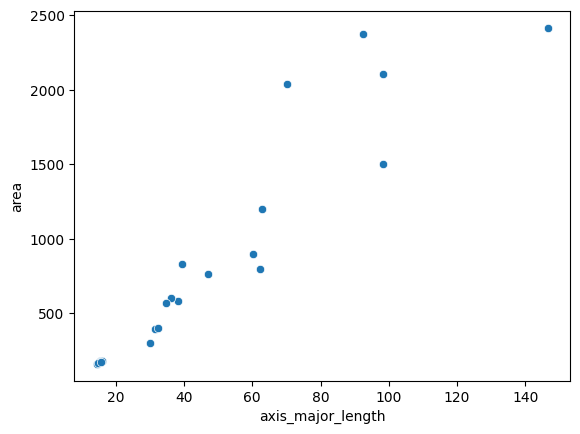

In [68]:
import seaborn as sns

sns.scatterplot(x='axis_major_length',y='area',data=df_features)

Clear correlation between blob's length and area can be observed

# **4. Analyze blobs**

Since you have the feature data in a pandas dataframe, you can exploit all the functions of te libraries. For instance:

How many blobs have an area above the average?

In [69]:
df_features.loc[df_features['area']>=df_features['area'].mean()]

,label,area,eccentricity,extent,axis_major_length
0,1,895.0,0.860351,0.454776,60.298385
4,5,2415.0,0.957469,0.336257,146.625476
6,7,2375.0,0.859771,0.565476,92.446065
9,10,828.0,0.517378,0.591429,39.385737
12,13,2040.0,0.524475,0.475746,70.130741
13,14,1197.0,0.910136,0.613217,62.778792
14,15,798.0,0.961756,0.633333,62.314944
20,21,2108.0,0.904441,0.410516,98.173332
21,22,1500.0,0.941878,0.352444,98.350157
25,26,761.0,0.888297,0.594531,47.078433


In [77]:
mean_blobs_area = df_features['area'].mean()
df_large_blobs = df_features.loc[df_features['area']>=mean_blobs_area]
N_large = df_large_blobs.shape[0]
print('there are {} blobs with an area larger or equal the mean area {}'.format(N_large,mean_blobs_area))

there are 10 blobs with an area larger or equal the mean area 728.1851851851852


Represent the blobs that have an area smaller than the average blob's area

In [78]:
mean_blobs_area = df_features['area'].mean()
df_small_blobs = df_features.loc[df_features['area']<=mean_blobs_area]
N_small = df_small_blobs.shape[0]
print('there are {} blobs with an area smaller or equal the mean area {}'.format(N_small,mean_blobs_area))

there are 17 blobs with an area smaller or equal the mean area 728.1851851851852


find the labels of small and large blobs

In [79]:
labels_small = df_small_blobs['label'].values
print('labels of small blobs: {}'.format(labels_small))
labels_large = df_large_blobs['label'].values
print('labels of large blobs: {}'.format(labels_large))


labels of small blobs: [ 2  3  4  6  8  9 11 12 16 17 18 19 20 23 24 25 27]
labels of large blobs: [ 1  5  7 10 13 14 15 21 22 26]


Create a binary mask with the large and small blobs

In [81]:
import numpy as np
mask_small_blobs = np.isin(label_image,labels_small)
mask_large_blobs = np.isin(label_image,labels_large)

Represent the large and small blobs

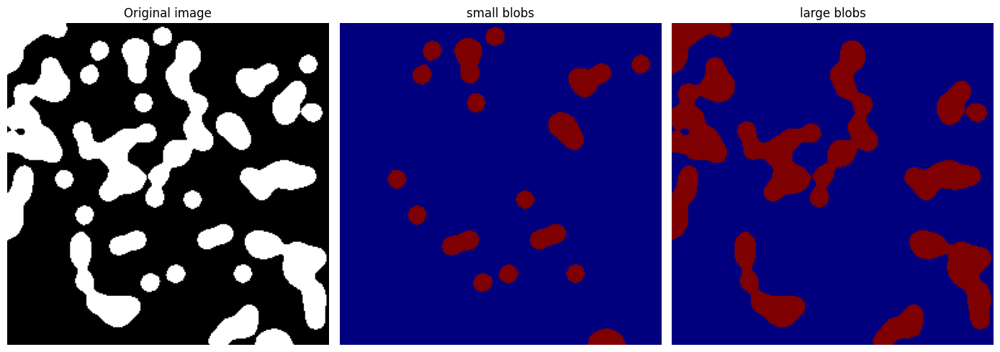

In [82]:
# Get some figures:
fig, axes = plt.subplots(1,3,figsize=(14, 9))
ax = axes.ravel()
ax[0].imshow(IG,cmap=plt.cm.gray)
ax[0].set_title('Original image')
ax[1].imshow(mask_small_blobs,cmap=plt.cm.jet)
ax[1].set_title('small blobs') # set figure title
ax[2].imshow(mask_large_blobs,cmap=plt.cm.jet)
ax[2].set_title('large blobs')

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()
plt.tight_layout()
plt.show()

# **5. Obtain texture-based regional properties**

For the original image

In [83]:
from skimage.feature.texture import graycomatrix, graycoprops

image = np.array([[0, 0, 1, 1],[0, 0, 1, 1],[0, 2, 2, 2],[2, 2, 3, 3]], dtype=np.uint8)
g = graycomatrix(IG, [1], [0], levels=4, normed=False, symmetric=False)
print(image)
print('Number of times that a grayscale level zero has a neighbour with value zero at a distance of 1 pixel to the right (angle equal zero): {}'.format(g[0,0,0,0]))
print('Number of times that a grayscale level zero has a neighbour with value 1 at a distance of 1 pixel to the right (angle equal zero): {}'.format(g[0,1,0,0]))
print('Number of times that a grayscale level 2 has a neighbour with value 2 at a distance of 1 pixel to the right (angle equal zero): {}'.format(g[2,2,0,0]))
print('Number of times that a grayscale level 2 has a neighbour with value 0 at a distance of 1 pixel to the right (angle equal zero): {}'.format(g[2,0,0,0]))

[[0 0 1 1]
 [0 0 1 1]
 [0 2 2 2]
 [2 2 3 3]]
Number of times that a grayscale level zero has a neighbour with value zero at a distance of 1 pixel to the right (angle equal zero): 44721
Number of times that a grayscale level zero has a neighbour with value 1 at a distance of 1 pixel to the right (angle equal zero): 898
Number of times that a grayscale level 2 has a neighbour with value 2 at a distance of 1 pixel to the right (angle equal zero): 0
Number of times that a grayscale level 2 has a neighbour with value 0 at a distance of 1 pixel to the right (angle equal zero): 0


In [85]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from skimage.feature.texture import graycomatrix, graycoprops
from skimage.measure import regionprops
from skimage import img_as_ubyte

# Suponiendo que tienes:
# - `IG`: imagen en escala de grises normalizada (float o uint8)
# - `label_image`: imagen segmentada (mismo tamaño que IG)

props = regionprops(label_image, intensity_image=IG)
nregions = len(props)

props_texture = np.zeros((nregions, 5))
for i, p in enumerate(props):
    minr, minc, maxr, maxc = p.bbox
    I = IG[minr:maxr, minc:maxc]

    # Convertir a uint8 y escalar valores si es necesario
    Iu8 = img_as_ubyte(I)

    # Calcular GLCM
    g = graycomatrix(Iu8, distances=[1], angles=[0], levels=256, normed=True, symmetric=True)

    # Extraer características
    props_texture[i, 0] = graycoprops(g, 'contrast')[0, 0]
    props_texture[i, 1] = graycoprops(g, 'dissimilarity')[0, 0]
    props_texture[i, 2] = graycoprops(g, 'homogeneity')[0, 0]
    props_texture[i, 3] = graycoprops(g, 'energy')[0, 0]
    props_texture[i, 4] = graycoprops(g, 'correlation')[0, 0]

# Exportar a Excel
df = pd.DataFrame(props_texture, columns=['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation'])
df.to_excel("/content/images.xlsx", index=False)
df

,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,2429.579657,9.527763,0.962637,0.685923,0.924295
1,5573.571429,21.857143,0.914287,0.790706,0.710832
2,5160.714286,20.238095,0.920636,0.751081,0.781250
3,6676.674107,26.183036,0.897323,0.754048,0.697360
4,3237.874167,12.697546,0.950206,0.688277,0.896037
5,7121.785714,27.928571,0.890478,0.753969,0.672087
6,2590.889213,10.160350,0.960156,0.694316,0.916933
7,3430.050505,13.451178,0.947251,0.712373,0.880807
8,6676.674107,26.183036,0.897323,0.754048,0.697360
9,4144.450549,16.252747,0.936265,0.679238,0.866928
